In [1]:
import os
import sys
import bz2
import math
import time
import pickle
import argparse
import itertools
from imageio import imread
import matplotlib.pyplot as plt

In [2]:
# Scientific & Imaging Libraries
import numpy as np
import scipy.optimize, scipy.ndimage, scipy.misc
import PIL
from PIL import Image

# Numeric Computing (GPU)
import theano
import theano.tensor as T
import theano.tensor.nnet.neighbours

# Support ansi colors in Windows too.
if sys.platform == 'win32':
    import colorama

# Deep Learning Framework
import lasagne
from lasagne.layers import Conv2DLayer as ConvLayer, Pool2DLayer as PoolLayer
from lasagne.layers import InputLayer, ConcatLayer

## Color coded output helps visualize the information a little better, plus looks cool!

In [3]:
# Color coded output helps visualize the information a little better, plus looks cool!
class ansi:
    BOLD = '\033[1;97m'
    WHITE = '\033[0;97m'
    YELLOW = '\033[0;33m'
    YELLOW_B = '\033[0;33m'
    RED = '\033[0;31m'
    RED_B = '\033[1;31m'
    BLUE = '\033[0;94m'
    BLUE_B = '\033[1;94m'
    CYAN = '\033[0;36m'
    CYAN_B = '\033[1;36m'
    ENDC = '\033[0m'
    
def error(message, *lines):
    string = "\n{}ERROR: " + message + "{}\n" + "\n".join(lines) + "{}\n"
    print(string.format(ansi.RED_B, ansi.RED, ansi.ENDC))
    sys.exit(-1)

## Convolutional Neural Network

In [9]:
class Model(object):
    """
    Store all the data related to the neural network (aka. "model"). This is currently based on VGG19.
    """

    def __init__(self):
        self.pixel_mean = np.array([103.939, 116.779, 123.680], dtype=np.float32).reshape((3,1,1))

        self.setup_model()
        self.load_data()

    def setup_model(self, input=None):
        """
        Use lasagne to create a network of convolution layers, first using VGG19 as the framework
        and then adding augmentations for Semantic Style Transfer.
        """
        net, self.channels = {}, {}

        # Primary network for the main image. These are convolution only, and stop at layer 4_2 (rest unused).
        net['img']     = input or InputLayer((None, 3, None, None))
        net['conv1_1'] = ConvLayer(net['img'],     64, 3, pad=1)
        net['conv1_2'] = ConvLayer(net['conv1_1'], 64, 3, pad=1)
        net['pool1']   = PoolLayer(net['conv1_2'], 2, mode='average_exc_pad')
        net['conv2_1'] = ConvLayer(net['pool1'],   128, 3, pad=1)
        net['conv2_2'] = ConvLayer(net['conv2_1'], 128, 3, pad=1)
        net['pool2']   = PoolLayer(net['conv2_2'], 2, mode='average_exc_pad')
        net['conv3_1'] = ConvLayer(net['pool2'],   256, 3, pad=1)
        net['conv3_2'] = ConvLayer(net['conv3_1'], 256, 3, pad=1)
        net['conv3_3'] = ConvLayer(net['conv3_2'], 256, 3, pad=1)
        net['conv3_4'] = ConvLayer(net['conv3_3'], 256, 3, pad=1)
        net['pool3']   = PoolLayer(net['conv3_4'], 2, mode='average_exc_pad')
        net['conv4_1'] = ConvLayer(net['pool3'],   512, 3, pad=1)
        net['conv4_2'] = ConvLayer(net['conv4_1'], 512, 3, pad=1)
        net['conv4_3'] = ConvLayer(net['conv4_2'], 512, 3, pad=1)
        net['conv4_4'] = ConvLayer(net['conv4_3'], 512, 3, pad=1)
        net['pool4']   = PoolLayer(net['conv4_4'], 2, mode='average_exc_pad')
        net['conv5_1'] = ConvLayer(net['pool4'],   512, 3, pad=1)
        net['conv5_2'] = ConvLayer(net['conv5_1'], 512, 3, pad=1)
        net['conv5_3'] = ConvLayer(net['conv5_2'], 512, 3, pad=1)
        net['conv5_4'] = ConvLayer(net['conv5_3'], 512, 3, pad=1)
        net['main']    = net['conv5_4']

        # Auxiliary network for the semantic layers, and the nearest neighbors calculations.
        net['map'] = InputLayer((1, 1, None, None))
        for j, i in itertools.product(range(5), range(4)):
            if j < 2 and i > 1: continue
            suffix = '%i_%i' % (j+1, i+1)

            if i == 0:
                net['map%i'%(j+1)] = PoolLayer(net['map'], 2**j, mode='average_exc_pad')
            self.channels[suffix] = net['conv'+suffix].num_filters
            
            if args.semantic_weight > 0.0:
                net['sem'+suffix] = ConcatLayer([net['conv'+suffix], net['map%i'%(j+1)]])
            else:
                net['sem'+suffix] = net['conv'+suffix]

            net['dup'+suffix] = InputLayer(net['sem'+suffix].output_shape)
            net['nn'+suffix] = ConvLayer(net['dup'+suffix], 1, 3, b=None, pad=0, flip_filters=False)

        self.network = net

    def load_data(self):
        """
        Open the serialized parameters from a pre-trained network, and load them into the model created.
        """
        vgg19_file = os.path.join(os.path.dirname('.'), 'vgg19_conv.pkl.bz2')
        if not os.path.exists(vgg19_file):
            error("Model file with pre-trained convolution layers not found. Download here...",
                  "https://github.com/alexjc/neural-doodle/releases/download/v0.0/vgg19_conv.pkl.bz2")

        data = pickle.load(bz2.open(vgg19_file, 'rb'))
        params = lasagne.layers.get_all_param_values(self.network['main'])
        lasagne.layers.set_all_param_values(self.network['main'], data[:len(params)])

    def setup(self, layers):
        """
        Setup the inputs and outputs, knowing the layers that are required by the optimization algorithm.
        """
        self.tensor_img = T.tensor4()
        self.tensor_map = T.tensor4()
        tensor_inputs = {self.network['img']: self.tensor_img, self.network['map']: self.tensor_map}
        outputs = lasagne.layers.get_output([self.network[l] for l in layers], tensor_inputs)
        self.tensor_outputs = {k: v for k, v in zip(layers, outputs)}

    def get_outputs(self, type, layers):
        """
        Fetch the output tensors for the network layers.
        """
        return [self.tensor_outputs[type+l] for l in layers]

    def prepare_image(self, image):
        """
        Given an image loaded from disk, turn it into a representation compatible with the model.
        The format is (b,c,y,x) with batch=1 for a single image, channels=3 for RGB, and y,x matching
        the resolution.
        """
        image = np.swapaxes(np.swapaxes(image, 1, 2), 0, 1)[::-1, :, :]
        image = image.astype(np.float32) - self.pixel_mean
        return image[np.newaxis]

    def finalize_image(self, image, resolution):
        """
        Based on the output of the neural network, convert it into an image format that can be saved
        to disk -- shuffling dimensions as appropriate.
        """
        image = np.swapaxes(np.swapaxes(image[::-1], 0, 1), 1, 2)
        image = np.clip(image, 0, 255).astype('uint8')
        # return scipy.misc.imresize(image, resolution, interp='bicubic')
        # print(resolution)
        return np.array(Image.fromarray(image, mode='RGB').resize((resolution[0], resolution[1]),
                                                      resample=Image.BICUBIC))

## Style transfer model : CNN + MRFs

In [143]:
class NeuralGenerator(object):
    """
    This is the main part of the application that generates an image using optimization and LBFGS.
    The images will be processed at increasing resolutions in the run() method.
    """

    def __init__(self):
        """
        Constructor sets up global variables, loads and validates files, then builds the model.
        """
        self.start_time = time.time()
        self.style_cache = {}
        self.style_layers = args.style_layers.split(',')
        self.content_layers = args.content_layers.split(',')
        self.used_layers = self.style_layers + self.content_layers

        # Prepare file output and load files specified as input.
        if args.save_every is not None:
            os.makedirs('frames', exist_ok=True)
        if args.output is not None and os.path.isfile(args.output):
            os.remove(args.output)

        print(ansi.CYAN, end='')
        target = args.content or args.output
        self.content_img_original, self.content_map_original = self.load_images('content', target)
        self.style_img_original, self.style_map_original = self.load_images('style', args.style)

        if self.content_map_original is None and self.content_img_original is None:
            print("  - No content files found; result depends on seed only.")
        print(ansi.ENDC, end='')

        # Display some useful errors if the user's input can't be undrestood.
        if self.style_img_original is None:
            error("Couldn't find style image as expected.",
                  "  - Try making sure `{}` exists and is a valid image.".format(args.style))

        if self.content_map_original is not None and self.style_map_original is None:
            basename, _ = os.path.splitext(args.style)
            error("Expecting a semantic map for the input style image too.",
                  "  - Try creating the file `{}_sem.png` with your annotations.".format(basename))

        if self.style_map_original is not None and self.content_map_original is None:
            basename, _ = os.path.splitext(target)
            error("Expecting a semantic map for the input content image too.",
                  "  - Try creating the file `{}_sem.png` with your annotations.".format(basename))

        if self.content_map_original is None:
            if self.content_img_original is None and args.output_size:
                shape = tuple([int(i) for i in args.output_size.split('x')])
            else:
                shape = self.style_img_original.shape[:2]

            self.content_map_original = np.zeros(shape+(3,))
            args.semantic_weight = 0.0

        if self.style_map_original is None:
            self.style_map_original = np.zeros(self.style_img_original.shape[:2]+(3,))
            args.semantic_weight = 0.0

        if self.content_img_original is None:
            self.content_img_original = np.zeros(self.content_map_original.shape[:2]+(3,))
            args.content_weight = 0.0

        if self.content_map_original.shape[2] != self.style_map_original.shape[2]:
            error("Mismatch in number of channels for style and content semantic map.",
                  "  - Make sure both images are RGB, RGBA, or L.")

        # Finalize the parameters based on what we loaded, then create the model.
        args.semantic_weight = math.sqrt(9.0 / args.semantic_weight) if args.semantic_weight else 0.0
        self.model = Model()
        
        self.evaluation = {
            "intermediate_outputs": [],
            "content": self.content_img_original,
            "style": self.style_img_original,
            "total_loss": [],
            "3_1": [],
            "4_1": [],
            "4_2": []
        }


    #------------------------------------------------------------------------------------------------------------------
    # Helper Functions
    #------------------------------------------------------------------------------------------------------------------

    def load_images(self, name, filename):
        """
        If the image and map files exist, load them. Otherwise they'll be set to default values later.
        """
        basename, _ = os.path.splitext(filename)
        mapname = basename + args.semantic_ext
        img = imread(filename) if os.path.exists(filename) else None
        map = imread(mapname) if os.path.exists(mapname) and args.semantic_weight > 0.0 else None

        if img is not None: print('  - Loading `{}` for {} data.'.format(filename, name))
        if map is not None: print('  - Adding `{}` as semantic map.'.format(mapname))

        if img is not None and map is not None and img.shape[:2] != map.shape[:2]:
            error("The {} image and its semantic map have different resolutions. Either:".format(name),
                  "  - Resize {} to {}, or\n  - Resize {} to {}."\
                  .format(filename, map.shape[1::-1], mapname, img.shape[1::-1]))
        return img, map

    def compile(self, arguments, function):
        """
        Build a Theano function that will run the specified expression on the GPU.
        """
        return theano.function(list(arguments), function, on_unused_input='ignore')

    def compute_norms(self, backend, layer, array):
        ni = backend.sqrt(backend.sum(array[:,:self.model.channels[layer]] ** 2.0, axis=(1,), keepdims=True))
        ns = backend.sqrt(backend.sum(array[:,self.model.channels[layer]:] ** 2.0, axis=(1,), keepdims=True))
        return [ni] + [ns]

    def normalize_components(self, layer, array, norms):
        if args.style_weight > 0.0:
            array[:,:self.model.channels[layer]] /= (norms[0] * 3.0)
        if args.semantic_weight > 0.0:
            array[:,self.model.channels[layer]:] /= (norms[1] * args.semantic_weight)


    #------------------------------------------------------------------------------------------------------------------
    # Initialization & Setup
    #------------------------------------------------------------------------------------------------------------------

    def rescale_image(self, img, scale):
        """
        Re-implementing skimage.transform.scale without the extra dependency. Saves a lot of space and hassle!
        """
        # output = scipy.misc.toimage(img, cmin=0.0, cmax=255)
        # print(img, np.max(img), np.min(img))
        # return rescale(img, scale, anti_aliasing=True)
        # a = np.asarray(img)
        output = Image.fromarray(img, mode='RGB')
        output.thumbnail((int(output.size[0]*scale), int(output.size[1]*scale)), PIL.Image.ANTIALIAS)
        return np.asarray(output)

    def prepare_content(self, scale=1.0):
        """
        Called each phase of the optimization, rescale the original content image and its map to use as inputs.
        """
        content_img = self.rescale_image(self.content_img_original, scale)
        self.content_img = self.model.prepare_image(content_img)

        content_map = self.rescale_image(self.content_map_original, scale)
        self.content_map = content_map.transpose((2, 0, 1))[np.newaxis].astype(np.float32)

    def prepare_style(self, scale=1.0):
        """
        Called each phase of the optimization, process the style image according to the scale, then run it
        through the model to extract intermediate outputs (e.g. sem4_1) and turn them into patches.
        """
        style_img = self.rescale_image(self.style_img_original, scale)
        self.style_img = self.model.prepare_image(style_img)

        style_map = self.rescale_image(self.style_map_original, scale)
        self.style_map = style_map.transpose((2, 0, 1))[np.newaxis].astype(np.float32)

        # Compile a function to run on the GPU to extract patches for all layers at once.
        layer_outputs = zip(self.style_layers, self.model.get_outputs('sem', self.style_layers))
        extractor = self.compile([self.model.tensor_img, self.model.tensor_map], self.do_extract_patches(layer_outputs))
        result = extractor(self.style_img, self.style_map)

        # Store all the style patches layer by layer, resized to match slice size and cast to 16-bit for size. 
        self.style_data = {}
        for layer, *data in zip(self.style_layers, result[0::3], result[1::3], result[2::3]):
            patches = data[0]
            l = self.model.network['nn'+layer]
            l.num_filters = patches.shape[0] // args.slices
            self.style_data[layer] = [d[:l.num_filters*args.slices].astype(np.float16) for d in data]\
                                   + [np.zeros((patches.shape[0],), dtype=np.float16)]
            print('  - Style layer {}: {} patches in {:,}kb.'.format(layer, patches.shape, patches.size//1000))

    def prepare_optimization(self):
        """
        Optimization requires a function to compute the error (aka. loss) which is done in multiple components.
        Here we compile a function to run on the GPU that returns all components separately.
        """

        # Feed-forward calculation only, returns the result of the convolution post-activation 
        self.compute_features = self.compile([self.model.tensor_img, self.model.tensor_map],
                                             self.model.get_outputs('sem', self.style_layers))

        # Patch matching calculation that uses only pre-calculated features and a slice of the patches.
        
        self.matcher_tensors = {l: lasagne.utils.shared_empty(dim=4) for l in self.style_layers}
        self.matcher_history = {l: T.vector() for l in self.style_layers} 
        self.matcher_inputs = {self.model.network['dup'+l]: self.matcher_tensors[l] for l in self.style_layers}
        nn_layers = [self.model.network['nn'+l] for l in self.style_layers]
        self.matcher_outputs = dict(zip(self.style_layers, lasagne.layers.get_output(nn_layers, self.matcher_inputs)))

        self.compute_matches = {l: self.compile([self.matcher_history[l]], self.do_match_patches(l))\
                                                for l in self.style_layers}

        self.tensor_matches = [T.tensor4() for l in self.style_layers]
        # Build a list of Theano expressions that, once summed up, compute the total error.
        self.losses = self.content_loss() + self.total_variation_loss() + self.style_loss()
        # Let Theano automatically compute the gradient of the error, used by LBFGS to update image pixels.
        grad = T.grad(sum([l[-1] for l in self.losses]), self.model.tensor_img)
        # Create a single function that returns the gradient and the individual errors components.
        self.compute_grad_and_losses = theano.function(
                                                [self.model.tensor_img, self.model.tensor_map] + self.tensor_matches,
                                                [grad] + [l[-1] for l in self.losses], on_unused_input='ignore')


    #------------------------------------------------------------------------------------------------------------------
    # Theano Computation
    #------------------------------------------------------------------------------------------------------------------

    def do_extract_patches(self, layers, size=3, stride=1):
        """
        This function builds a Theano expression that will get compiled an run on the GPU. It extracts 3x3 patches
        from the intermediate outputs in the model.
        """
        results = []
        for l, f in layers:
            # Use a Theano helper function to extract "neighbors" of specific size, seems a bit slower than doing
            # it manually but much simpler!
            patches = theano.tensor.nnet.neighbours.images2neibs(f, (size, size), (stride, stride), mode='valid')
            # Make sure the patches are in the shape required to insert them into the model as another layer.
            patches = patches.reshape((-1, patches.shape[0] // f.shape[1], size, size)).dimshuffle((1, 0, 2, 3))
            # Calculate the magnitude that we'll use for normalization at runtime, then store...
            results.extend([patches] + self.compute_norms(T, l, patches))
        return results

    def do_match_patches(self, layer):
        # Use node in the model to compute the result of the normalized cross-correlation, using results from the
        # nearest-neighbor layers called 'nn3_1' and 'nn4_1'.
        dist = self.matcher_outputs[layer]
        dist = dist.reshape((dist.shape[1], -1))
        # Compute the score of each patch, taking into account statistics from previous iteration. This equalizes
        # the chances of the patches being selected when the user requests more variety.
        offset = self.matcher_history[layer].reshape((-1, 1))
        scores = (dist - offset * args.variety)
        # Pick the best style patches for each patch in the current image, the result is an array of indices.
        # Also return the maximum value along both axis, used to compare slices and add patch variety.
        return [scores.argmax(axis=0), scores.max(axis=0), dist.max(axis=1)]


    #------------------------------------------------------------------------------------------------------------------
    # Error/Loss Functions
    #------------------------------------------------------------------------------------------------------------------

    def content_loss(self):
        """
        Return a list of Theano expressions for the error function, measuring how different the current image is
        from the reference content that was loaded.
        """

        content_loss = []
        if args.content_weight == 0.0:
            return content_loss

        # First extract all the features we need from the model, these results after convolution.
        extractor = theano.function([self.model.tensor_img], self.model.get_outputs('conv', self.content_layers))
        result = extractor(self.content_img)

        # Build a list of loss components that compute the mean squared error by comparing current result to desired.
        for l, ref in zip(self.content_layers, result):
            layer = self.model.tensor_outputs['conv'+l]
            loss = T.mean((layer - ref) ** 2.0)
            content_loss.append(('content', l, args.content_weight * loss))
            print('  - Content layer conv{}: {} features in {:,}kb.'.format(l, ref.shape[1], ref.size//1000))
        return content_loss

    def style_loss(self):
        """
        Returns a list of loss components as Theano expressions. Finds the best style patch for each patch in the
        current image using normalized cross-correlation, then computes the mean squared error for all patches.
        """
        style_loss = []
        if args.style_weight == 0.0:
            return style_loss

        # Extract the patches from the current image, as well as their magnitude.
        result = self.do_extract_patches(zip(self.style_layers, self.model.get_outputs('conv', self.style_layers)))

        # Multiple style layers are optimized separately, usually conv3_1 and conv4_1 — semantic data not used here.
        for l, matches, patches in zip(self.style_layers, self.tensor_matches, result[0::3]):
            # Compute the mean squared error between the current patch and the best matching style patch.
            # Ignore the last channels (from semantic map) so errors returned are indicative of image only.
            loss = T.mean((patches - matches[:,:self.model.channels[l]]) ** 2.0)
            style_loss.append(('style', l, args.style_weight * loss))
        return style_loss

    def total_variation_loss(self):
        """
        Return a loss component as Theano expression for the smoothness prior on the result image.
        """
        x = self.model.tensor_img
        loss = (((x[:,:,:-1,:-1] - x[:,:,1:,:-1])**2 + (x[:,:,:-1,:-1] - x[:,:,:-1,1:])**2)**1.25).mean()
        return [('smooth', 'img', args.smoothness * loss)]


    #------------------------------------------------------------------------------------------------------------------
    # Optimization Loop
    #------------------------------------------------------------------------------------------------------------------

    def iterate_batches(self, *arrays, batch_size):
        """
        Break down the data in arrays batch by batch and return them as a generator.
        """ 
        total_size = arrays[0].shape[0]
        indices = np.arange(total_size)
        for index in range(0, total_size, batch_size):
            excerpt = indices[index:index + batch_size]
            yield excerpt, [a[excerpt] for a in arrays]

    def evaluate_slices(self, f, l):
        if args.cache and l in self.style_cache:
            return self.style_cache[l]

        layer, data = self.model.network['nn'+l], self.style_data[l]
        history = data[-1]

        best_idx, best_val = None, 0.0
        for idx, (bp, bi, bs, bh) in self.iterate_batches(*data, batch_size=layer.num_filters):
            weights = bp.astype(np.float32)
            self.normalize_components(l, weights, (bi, bs))
            layer.W.set_value(weights)

            cur_idx, cur_val, cur_match = self.compute_matches[l](history[idx])
            if best_idx is None:
                best_idx, best_val = cur_idx, cur_val
            else:
                i = np.where(cur_val > best_val)
                best_idx[i] = idx[cur_idx[i]]
                best_val[i] = cur_val[i]

            history[idx] = cur_match

        if args.cache:
            self.style_cache[l] = best_idx
        return best_idx

    def evaluate(self, Xn):
        """
        Callback for the L-BFGS optimization that computes the loss and gradients on the GPU.
        """
        # Adjust the representation to be compatible with the model before computing results.
        current_img = Xn.reshape(self.content_img.shape).astype(np.float32) - self.model.pixel_mean
        current_features = self.compute_features(current_img, self.content_map)

        # Iterate through each of the style layers one by one, computing best matches.
        current_best = []
        for l, f in zip(self.style_layers, current_features):
            self.normalize_components(l, f, self.compute_norms(np, l, f))
            self.matcher_tensors[l].set_value(f)

            # Compute best matching patches this style layer, going through all slices.
            warmup = bool(args.variety > 0.0 and self.iteration == 0)
            for _ in range(2 if warmup else 1):
                best_idx = self.evaluate_slices(f, l)

            patches = self.style_data[l][0]
            current_best.append(patches[best_idx].astype(np.float32))

        grads, *losses = self.compute_grad_and_losses(current_img, self.content_map, *current_best)
        if np.isnan(grads).any():
            raise OverflowError("Optimization diverged; try using a different device or parameters.")

        # Use magnitude of gradients as an estimate for overall quality.
        self.error = self.error * 0.9 + 0.1 * min(np.abs(grads).max(), 255.0)
        loss = sum(losses)

        # Dump the image to disk if requested by the user.
        if args.save_every and self.frame % args.save_every == 0:
            frame = Xn.reshape(self.content_img.shape[1:])
            new_shape = (frame.shape)
            resolution = self.content_img_original.shape
            # print(resolution)
            # image = Image.fromarray(self.model.finalize_image(frame, (resolution[1], resolution[0], resolution[2])), mode='RGB')
            image = Image.fromarray(self.model.finalize_image(frame, (new_shape[2], new_shape[1], new_shape[0])), mode='RGB')
            self.evaluation['intermediate_outputs'].append(image)
            image.save('frames/%04d.png'%self.frame)

        # Print more information to the console every few iterations.
        if args.print_every and self.frame % args.print_every == 0:
            print('{:>3}   {}loss{} {:8.2e} '.format(self.frame, ansi.BOLD, ansi.ENDC, loss / 1000.0), end='')
            category = ''
            for v, l in zip(losses, self.losses):
                if l[0] == 'smooth':
                    continue
                if l[0] != category:
                    print('  {}{}{}'.format(ansi.BOLD, l[0], ansi.ENDC), end='')
                    category = l[0]
                print(' {}{}{} {:8.2e} '.format(ansi.BOLD, l[1], ansi.ENDC, v / 1000.0), end='')
                self.evaluation[l[1]].append(v / 1000.0)

            current_time = time.time()
            quality = 100.0 - 100.0 * np.sqrt(self.error / 255.0)
            print('  {}quality{} {: >4.1f}% '.format(ansi.BOLD, ansi.ENDC, quality), end='')
            print('  {}time{} {:3.1f}s '.format(ansi.BOLD, ansi.ENDC, current_time - self.iter_time), flush=True)
            self.iter_time = current_time

        # Update counters and timers.
        self.frame += 1
        self.iteration += 1
        self.evaluation['total_loss'].append(loss / 1000.0)
        

        # Return the data in the right format for L-BFGS.
        return loss, np.array(grads).flatten().astype(np.float64)

    def run(self):
        """
        The main entry point for the application, runs through multiple phases at increasing resolutions.
        """
        self.frame, Xn = 0, None
        for i in range(len(args.phases)):
            self.error = 255.0
            # scale = 1.0 / 2.0 ** (args.phases - 1 - i)
            scale = args.phases[i]

            shape = self.content_img_original.shape
            print('\n{}Phase #{}: resolution {}x{}  scale {}{}'\
                    .format(ansi.BLUE_B, i, int(shape[1]*scale), int(shape[0]*scale), scale, ansi.BLUE))

            # Precompute all necessary data for the various layers, put patches in place into augmented network.
            self.model.setup(layers=['sem'+l for l in self.style_layers] + ['conv'+l for l in self.content_layers])
            self.prepare_content(scale)
            self.prepare_style(scale)

            # Now setup the model with the new data, ready for the optimization loop.
            self.model.setup(layers=['sem'+l for l in self.style_layers] + ['conv'+l for l in self.used_layers])
            self.prepare_optimization()
            print('{}'.format(ansi.ENDC))

            # Setup the seed for the optimization as specified by the user.
            shape = self.content_img.shape[2:]
            if args.seed == 'content':
                Xn = self.content_img[0] + self.model.pixel_mean
                # Xn = self.content_img[0]
            if args.seed == 'noise':
                bounds = [int(i) for i in args.seed_range.split(':')]
                Xn = np.random.uniform(bounds[0], bounds[1], shape + (3,)).astype(np.float32)
            if args.seed == 'previous':
                # Xn = scipy.misc.imresize(Xn[0], shape, interp='bicubic')
                # print(Xn.shape)
                #print(Xn, shape)
                Xn = Image.fromarray(np.uint8(Xn[0]), mode='RGB').resize((shape[0], shape[1]), resample=Image.BICUBIC)
                Xn = np.array(Xn).transpose((2, 0, 1))[np.newaxis]
            if os.path.exists(args.seed):
                seed_image = imread(args.seed)
                # seed_image = scipy.misc.imresize(seed_image, shape, interp='bicubic')
                seed_image = Image.fromarray(np.uint8(seed_image), mode='RGB').resize((shape[0], shape[1]),
                                                                                      resample=Image.BICUBIC)
                self.seed_image = self.model.prepare_image(seed_image)
                Xn = self.seed_image[0] + self.model.pixel_mean
            if Xn is None:
                error("Seed for optimization was not found. You can either...",
                      "  - Set the `--seed` to `content` or `noise`.", "  - Specify `--seed` as a valid filename.")

            # Optimization algorithm needs min and max bounds to prevent divergence.
            data_bounds = np.zeros((np.product(Xn.shape), 2), dtype=np.float64)
            data_bounds[:] = (0.0, 255.0)

            self.iter_time, self.iteration, interrupt = time.time(), 0, False
            try:
                Xn, Vn, info = scipy.optimize.fmin_l_bfgs_b(
                                self.evaluate,
                                Xn.astype(np.float64).flatten(),
                                bounds=data_bounds,
                                factr=0.0, pgtol=0.0,            # Disable automatic termination, set low threshold.
                                m=5,                             # Maximum correlations kept in memory by algorithm.
                                maxfun=args.iterations-1,        # Limit number of calls to evaluate().
                                iprint=-1)                       # Handle our own logging of information.
            except OverflowError:
                error("The optimization diverged and NaNs were encountered.",
                      "  - Try using a different `--device` or change the parameters.",
                      "  - Make sure libraries are updated to work around platform bugs.")
            except KeyboardInterrupt:
                interrupt = True

            args.seed = 'previous'
            resolution = self.content_img.shape
            Xn = Xn.reshape(resolution)

            # output = self.model.finalize_image(Xn[0], self.content_img_original.shape)
            output = self.model.finalize_image(Xn[0], (self.content_img_original.shape[1],
                                                       self.content_img_original.shape[0],
                                                       self.content_img_original.shape[2]))
            Image.fromarray(output).save(args.output)
            if interrupt: break

        status = "finished in" if not interrupt else "interrupted at"
        print('\n{}Optimization {} {:3.1f}s, average pixel error {:3.1f}!{}\n'\
              .format(ansi.CYAN, status, time.time() - self.start_time, self.error, ansi.ENDC))
    def get_history(self):
        return self.evaluation

### Arguments setup for model

In [18]:
class Arguments():
    def __init__(self, content=None, content_weight=10.0, content_layers='4_2', style=None,
                 style_weight=10.0, style_layers="3_1,4_1", phases=[0.85, 0.9, 0.95, 1, 1.05, 1.1, 1.15],
                 smoothness=1E+0, seed='noise',
                 iterations = 100, device='cpu', print_every=10, save_every=10):
        self.content = content 
        self.content_weight = content_weight 
        self.content_layers = content_layers
        self.style = style
        self.style_weight = style_weight
        self.style_layers = style_layers
        self.semantic_ext = '_sem.png'
        self.semantic_weight = 10.0
        self.output = 'output.png'
        self.phases = phases
        self.slices = 2
        self.cache = 0
        self.smoothness = smoothness
        self.variety = 0.0
        self.seed = seed
        self.seed_range = '16:240'
        self.iterations = iterations
        self.device = device
        self.print_every = print_every
        self.save_every = save_every
        

In [155]:
def visualise_history(history, iterations):
    # history = generator.get_history()
    images = history['intermediate_outputs']
    losses = history['total_loss']
    content_loss = history['4_2']
    style_loss_1 = history['3_1']
    style_loss_2 = history['4_1']
    content_image = history['content']
    sytle_image = history['style']
    
    plt.figure(figsize=(20,20))
    position = 0
    rows = len(images) // 10 + 1
    for i in range(1, len(images), 2):
        position += 1
        plt.subplot(rows,5,position)
        plt.imshow(images[i-1])
        plt.axis('off')
        plt.title('intermediate output of iteration %d' % (i*10))
    
    plt.figure(figsize=(16,8))
    plt.plot(range(0, iterations, 10),[losses[i] for i in range(0, iterations, 10)],marker='o',color='r')
    plt.plot(range(0, iterations, 10),content_loss[:iterations//10],marker='v',color='g')
    plt.plot(range(0, iterations, 10),style_loss_1[:iterations//10],marker='<',color='b')
    plt.plot(range(0, iterations, 10),style_loss_2[:iterations//10],marker='>',color='b')
    plt.title('losses')
    plt.legend(['total_loss', 'content_loss', 'style_loss_3_1', 'style_loss_4_1'])
    plt.show()
    
    plt.figure(figsize=(16, 8))
    plt.subplot(1,3,1)
    plt.imshow(history['content'])
    plt.axis('off')
    plt.subplot(132)
    plt.imshow(history['style'])
    plt.axis('off')
    plt.subplot(133)
    plt.imshow(history['intermediate_outputs'][-1])
    plt.axis('off')

In [192]:
content = './data/content/Landscape-Photography-steps.jpg'
style = './data/style/starry_night_full.jpg'
content_weight = 10.0
style_weight = 10.0
phases = [0.5]
smoothness = 1E+0
seed = 'content'
device = 'cpu'
args = Arguments(content=content, style=style, content_weight=content_weight, 
                 style_weight=style_weight, phases=phases, smoothness=smoothness,
                 device=device, seed=seed)

## Experiment 1 : Scene to Art

### 1. From content to sythesised image

In [179]:
generator = NeuralGenerator()
generator.run()

  - Loading `./data/content/Landscape-Photography-steps.jpg` for content data.
  - Loading `./data/style/starry_night_full.jpg` for style data.

Phase #0: resolution 370x243  scale 0.5
  - Style layer 3_1: (19592, 256, 3, 3) patches in 45,139kb.
  - Style layer 4_1: (4758, 512, 3, 3) patches in 21,924kb.
  - Content layer conv4_2: 512 features in 706kb.

  0   loss 2.24e+03   content 4_2 0.00e+00   style 3_1 2.86e+02  4_1 1.95e+03   quality  5.0%   time 20.1s 
 10   loss 1.42e+03   content 4_2 3.44e+02   style 3_1 1.86e+02  4_1 8.85e+02   quality 43.1%   time 246.9s 
 20   loss 1.35e+03   content 4_2 3.71e+02   style 3_1 1.66e+02  4_1 8.05e+02   quality 65.7%   time 213.7s 
 30   loss 1.32e+03   content 4_2 3.82e+02   style 3_1 1.56e+02  4_1 7.77e+02   quality 78.7%   time 166.3s 
 40   loss 1.30e+03   content 4_2 3.91e+02   style 3_1 1.48e+02  4_1 7.59e+02   quality 86.4%   time 178.0s 
 50   loss 1.29e+03   content 4_2 3.97e+02   style 3_1 1.43e+02  4_1 7.49e+02   quality 90.4%   tim

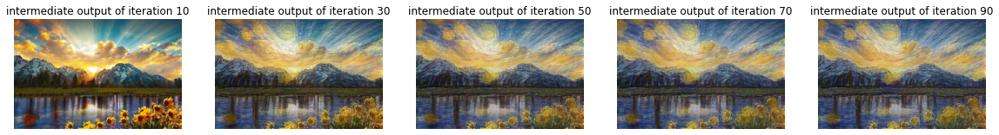

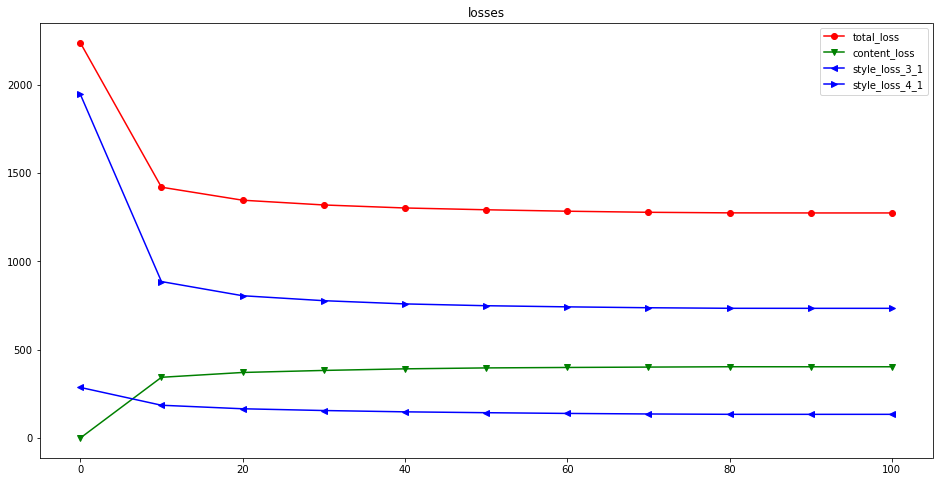

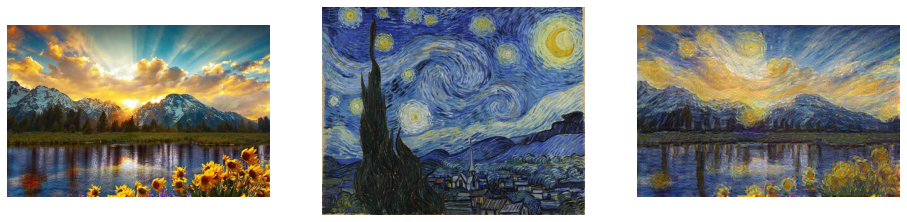

In [180]:
history = generator.get_history()
visualise_history(history, 110)

### 2. From noise to synthesised image

In [193]:
args.seed = "noise"
generator_2 = NeuralGenerator()
generator_2.run()

  - Loading `./data/content/Landscape-Photography-steps.jpg` for content data.
  - Loading `./data/style/starry_night_full.jpg` for style data.

Phase #0: resolution 370x243  scale 0.5
  - Style layer 3_1: (19592, 256, 3, 3) patches in 45,139kb.
  - Style layer 4_1: (4758, 512, 3, 3) patches in 21,924kb.
  - Content layer conv4_2: 512 features in 706kb.

  0   loss 2.19e+03   content 4_2 1.17e+03   style 3_1 1.35e+02  4_1 6.65e+02   quality  5.1%   time 19.1s 
 10   loss 1.25e+03   content 4_2 5.10e+02   style 3_1 1.22e+02  4_1 5.29e+02   quality 43.6%   time 215.9s 
 20   loss 1.09e+03   content 4_2 3.68e+02   style 3_1 1.19e+02  4_1 5.61e+02   quality 66.1%   time 197.6s 
 30   loss 1.03e+03   content 4_2 3.23e+02   style 3_1 1.16e+02  4_1 5.67e+02   quality 79.2%   time 180.6s 
 40   loss 9.99e+02   content 4_2 3.05e+02   style 3_1 1.12e+02  4_1 5.66e+02   quality 86.4%   time 177.4s 
 50   loss 9.83e+02   content 4_2 2.96e+02   style 3_1 1.09e+02  4_1 5.66e+02   quality 90.5%   tim

In [37]:
args.seed = "noise"
generator_2 = NeuralGenerator()
generator_2.run()


Phase #0: resolution 370x243  scale 0.5


/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'ds' parameter is not going to exist anymore as it is going to be replaced by the parameter 'ws'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'st' parameter is not going to exist anymore as it is going to be replaced by the parameter 'stride'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'padding' parameter is not going to exist anymore as it is going to be replaced by the parameter 'pad'.
  pooled = pool_2d(input,


  - Style layer 3_1: (19592, 256, 3, 3) patches in 45,139kb.
  - Style layer 4_1: (4758, 512, 3, 3) patches in 21,924kb.
  - Content layer conv4_2: 512 features in 706kb.

  0   loss 2.17e+03   content 4_2 1.17e+03   style 3_1 1.35e+02  4_1 6.54e+02   quality  5.1%   time 14.5s 
 10   loss 1.26e+03   content 4_2 5.19e+02   style 3_1 1.23e+02  4_1 5.26e+02   quality 43.6%   time 170.8s 
 20   loss 1.11e+03   content 4_2 3.78e+02   style 3_1 1.19e+02  4_1 5.70e+02   quality 66.1%   time 205.2s 
 30   loss 1.04e+03   content 4_2 3.33e+02   style 3_1 1.15e+02  4_1 5.71e+02   quality 79.1%   time 187.8s 
 40   loss 1.01e+03   content 4_2 3.14e+02   style 3_1 1.11e+02  4_1 5.68e+02   quality 86.5%   time 185.4s 
 50   loss 9.90e+02   content 4_2 3.03e+02   style 3_1 1.09e+02  4_1 5.66e+02   quality 90.5%   time 189.1s 
 60   loss 9.79e+02   content 4_2 3.01e+02   style 3_1 1.06e+02  4_1 5.62e+02   quality 92.8%   time 182.6s 
 70   loss 9.71e+02   content 4_2 2.98e+02   style 3_1 1.04e+02  4

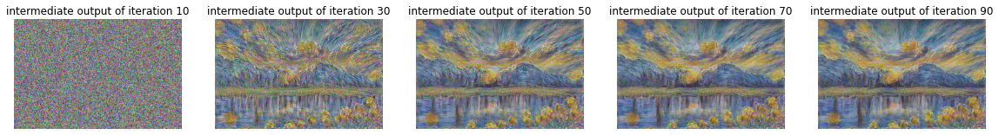

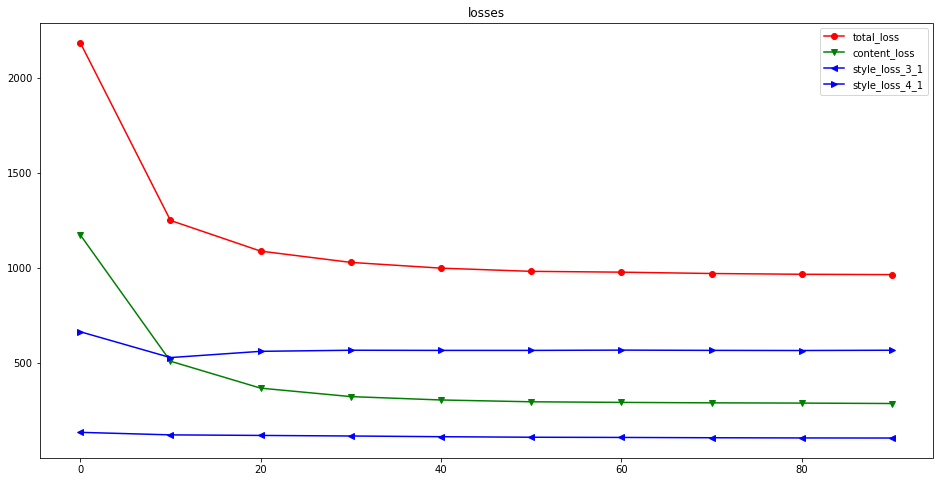

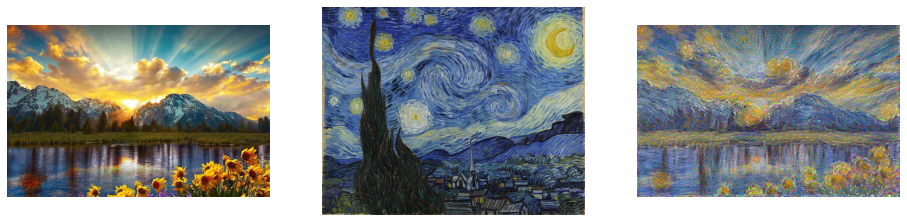

In [195]:
visualise_history(generator_2.get_history(), 100)

### 3. Pyramide implementation : with several scales

In [55]:
args.seed = "noise"
args.phases = [0.4, 0.45, 0.5, 0.55]
generator_3 = NeuralGenerator()
generator_3.run()

  - Loading `./data/content/Landscape-Photography-steps.jpg` for content data.
  - Loading `./data/style/starry_night_full.jpg` for style data.

Phase #0: resolution 296x194  scale 0.4


/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'ds' parameter is not going to exist anymore as it is going to be replaced by the parameter 'ws'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'st' parameter is not going to exist anymore as it is going to be replaced by the parameter 'stride'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'padding' parameter is not going to exist anymore as it is going to be replaced by the parameter 'pad'.
  pooled = pool_2d(input,


  - Style layer 3_1: (12375, 256, 3, 3) patches in 28,512kb.
  - Style layer 4_1: (2928, 512, 3, 3) patches in 13,492kb.
  - Content layer conv4_2: 512 features in 454kb.

  0   loss 2.41e+03   content 4_2 1.24e+03   style 3_1 1.54e+02  4_1 8.02e+02   quality  5.1%   time 7.0s 
 10   loss 1.34e+03   content 4_2 4.87e+02   style 3_1 1.29e+02  4_1 6.32e+02   quality 43.4%   time 79.6s 
 20   loss 1.16e+03   content 4_2 3.70e+02   style 3_1 1.23e+02  4_1 6.18e+02   quality 65.7%   time 88.1s 
 30   loss 1.10e+03   content 4_2 3.39e+02   style 3_1 1.19e+02  4_1 6.15e+02   quality 78.8%   time 86.9s 
 40   loss 1.06e+03   content 4_2 3.20e+02   style 3_1 1.14e+02  4_1 6.14e+02   quality 85.8%   time 85.4s 
 50   loss 1.05e+03   content 4_2 3.12e+02   style 3_1 1.11e+02  4_1 6.16e+02   quality 89.7%   time 87.5s 
 60   loss 1.04e+03   content 4_2 3.08e+02   style 3_1 1.09e+02  4_1 6.16e+02   quality 91.8%   time 81.4s 
 70   loss 1.03e+03   content 4_2 3.04e+02   style 3_1 1.08e+02  4_1 6.15

380   loss 1.02e+03   content 4_2 3.67e+02   style 3_1 1.05e+02  4_1 5.43e+02   quality 91.4%   time 272.6s 
390   loss 1.01e+03   content 4_2 3.61e+02   style 3_1 1.03e+02  4_1 5.41e+02   quality 93.3%   time 269.0s 
400   loss 1.00e+03   content 4_2 3.57e+02   style 3_1 1.01e+02  4_1 5.39e+02   quality 94.3%   time 254.5s 
410   loss 9.95e+02   content 4_2 3.54e+02   style 3_1 9.93e+01  4_1 5.39e+02   quality 94.6%   time 301.0s 
420   loss 9.91e+02   content 4_2 3.51e+02   style 3_1 9.80e+01  4_1 5.39e+02   quality 95.0%   time 237.9s 

Optimization finished in 8054.7s, average pixel error 0.6!



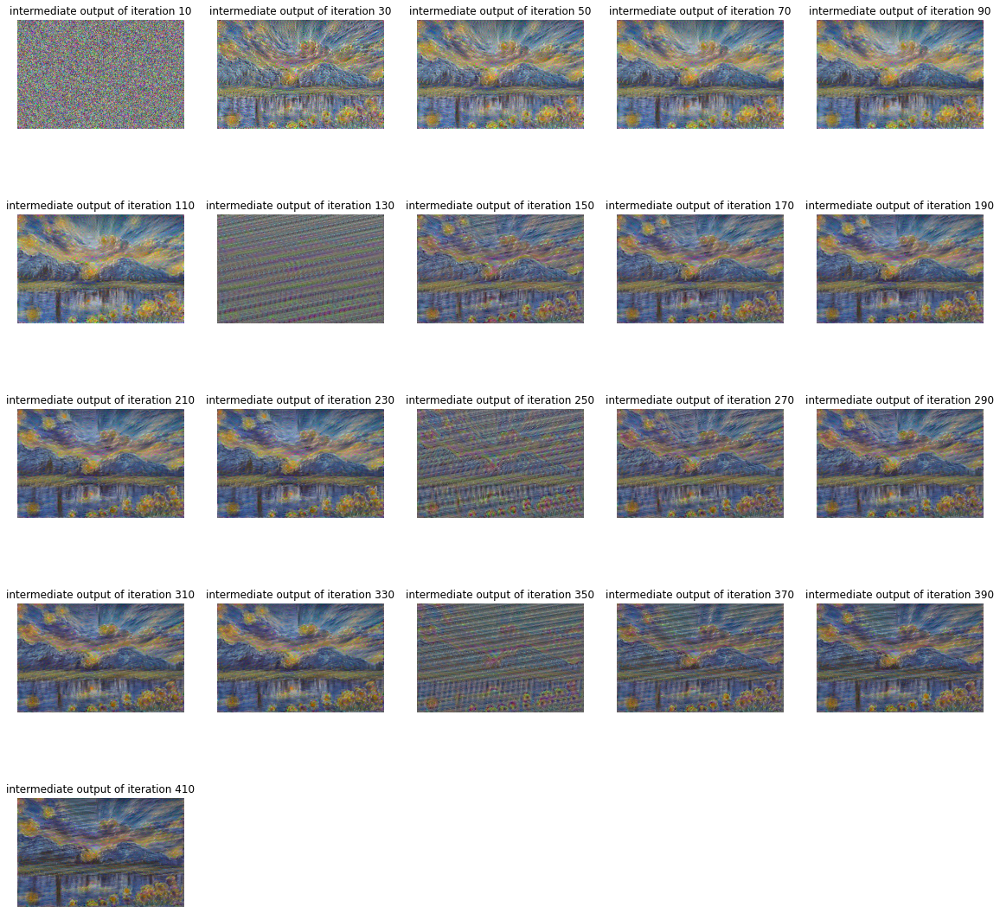

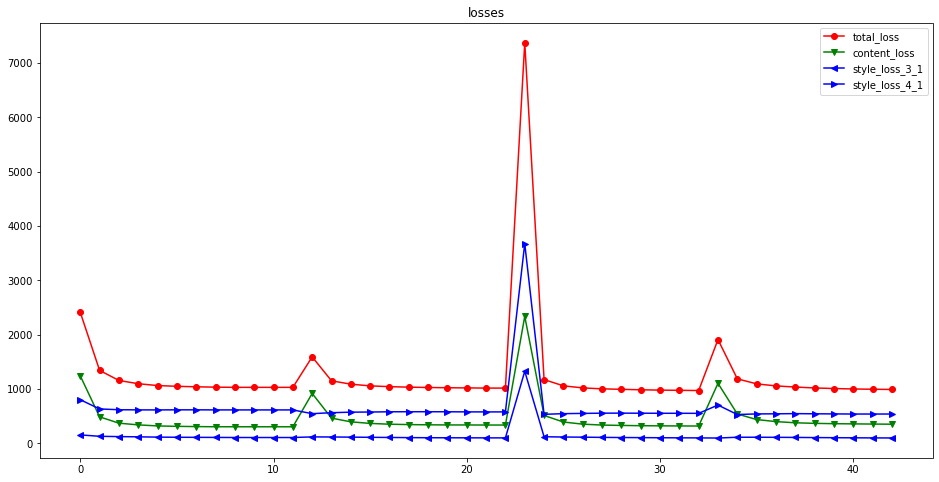

In [63]:
visualise_history(generator_3.get_history(), 430)

(-0.5, 406.5, 266.5, -0.5)

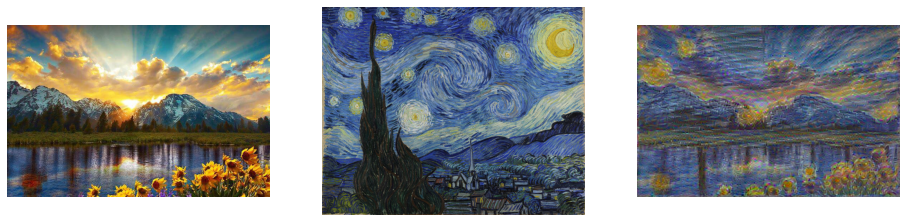

In [75]:
plt.figure(figsize=(16, 8))
plt.subplot(1,3,1)
plt.imshow(history['content'])
plt.axis('off')
plt.subplot(132)
plt.imshow(history['style'])
plt.axis('off')
plt.subplot(133)
plt.imshow(generator_3.get_history()['intermediate_outputs'][-1])
#plt.imshow(images[-1])
plt.axis('off')

## Experiment 2 : Portrait to Picasso art

In [181]:
args.style = './data/style/picasso.jpg'
args.content = './data/content/self.jpg'
args.phases = [0.5]
args.seed = 'content'
args.style_weight = 10.0
generator_4 = NeuralGenerator()
generator_4.run()

  - Loading `./data/content/self.jpg` for content data.
  - Loading `./data/style/picasso.jpg` for style data.

Phase #0: resolution 149x192  scale 0.5


/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'ds' parameter is not going to exist anymore as it is going to be replaced by the parameter 'ws'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'st' parameter is not going to exist anymore as it is going to be replaced by the parameter 'stride'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'padding' parameter is not going to exist anymore as it is going to be replaced by the parameter 'pad'.
  pooled = pool_2d(input,


  - Style layer 3_1: (1610, 256, 3, 3) patches in 3,709kb.
  - Style layer 4_1: (352, 512, 3, 3) patches in 1,622kb.
  - Content layer conv4_2: 512 features in 221kb.

  0   loss 2.29e+03   content 4_2 0.00e+00   style 3_1 3.06e+02  4_1 1.98e+03   quality  4.8%   time 3.0s 
 10   loss 1.63e+03   content 4_2 3.14e+02   style 3_1 2.39e+02  4_1 1.07e+03   quality 41.6%   time 33.8s 
 20   loss 1.54e+03   content 4_2 3.64e+02   style 3_1 2.21e+02  4_1 9.47e+02   quality 63.2%   time 39.0s 
 30   loss 1.50e+03   content 4_2 3.81e+02   style 3_1 2.10e+02  4_1 9.04e+02   quality 75.2%   time 31.0s 
 40   loss 1.48e+03   content 4_2 3.96e+02   style 3_1 2.04e+02  4_1 8.75e+02   quality 81.6%   time 32.2s 
 50   loss 1.47e+03   content 4_2 4.08e+02   style 3_1 2.00e+02  4_1 8.56e+02   quality 84.9%   time 37.0s 
 60   loss 1.46e+03   content 4_2 4.17e+02   style 3_1 1.97e+02  4_1 8.39e+02   quality 86.7%   time 37.9s 
 70   loss 1.45e+03   content 4_2 4.26e+02   style 3_1 1.94e+02  4_1 8.27e+02

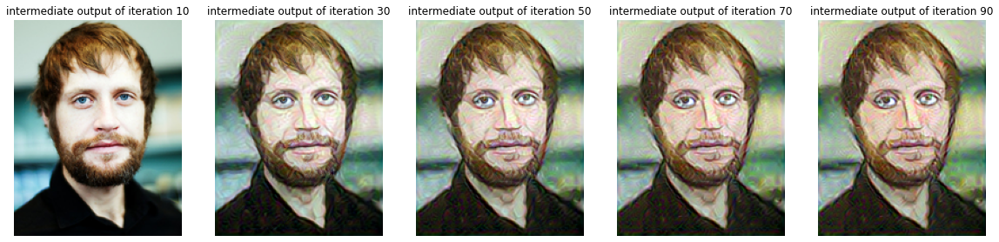

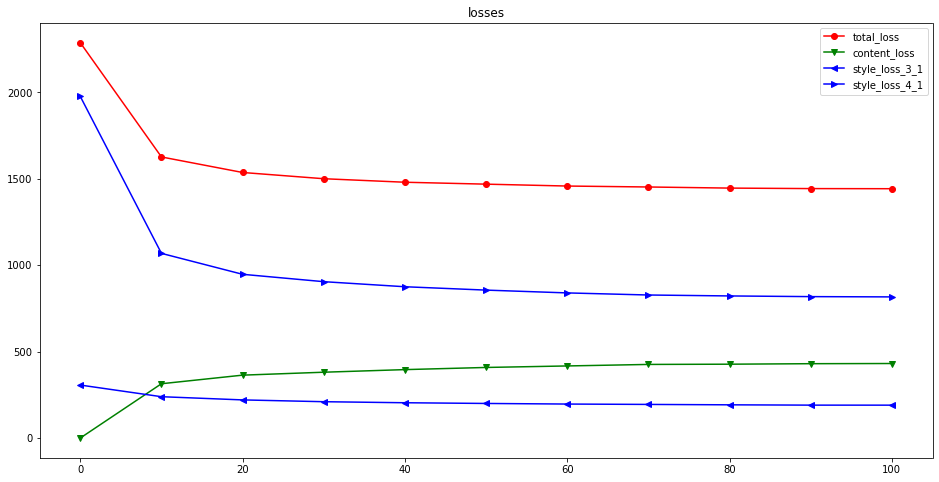

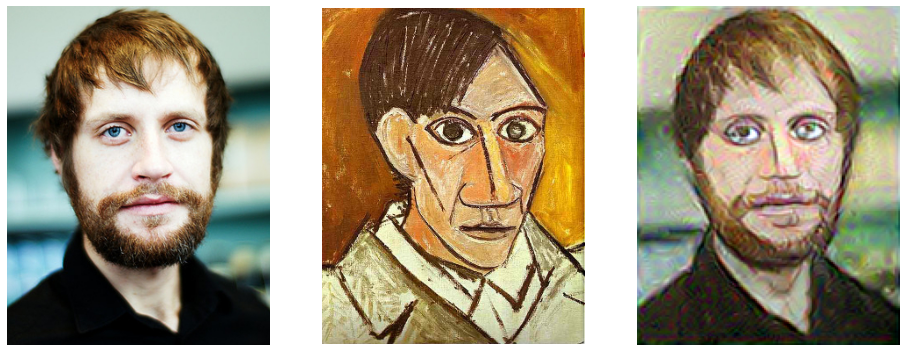

In [182]:
history_2 = generator_4.get_history()
visualise_history(history_2, 110)

### Generated with higher style loss

In [186]:
args.style = './data/style/picasso.jpg'
args.content = './data/content/self.jpg'
args.style_weight = 15.0
args.phases = [0.5]
args.iterations = 100
args.seed = 'content'
generator_5 = NeuralGenerator()
generator_5.run()

  - Loading `./data/content/self.jpg` for content data.
  - Loading `./data/style/picasso.jpg` for style data.

Phase #0: resolution 149x192  scale 0.5
  - Style layer 3_1: (1610, 256, 3, 3) patches in 3,709kb.
  - Style layer 4_1: (352, 512, 3, 3) patches in 1,622kb.
  - Content layer conv4_2: 512 features in 221kb.

  0   loss 3.43e+03   content 4_2 0.00e+00   style 3_1 4.60e+02  4_1 2.96e+03   quality  4.7%   time 2.4s 
 10   loss 2.19e+03   content 4_2 5.05e+02   style 3_1 3.44e+02  4_1 1.33e+03   quality 41.2%   time 25.4s 
 20   loss 2.05e+03   content 4_2 5.77e+02   style 3_1 3.23e+02  4_1 1.15e+03   quality 62.5%   time 28.6s 
 30   loss 1.99e+03   content 4_2 6.19e+02   style 3_1 3.02e+02  4_1 1.06e+03   quality 74.3%   time 30.9s 
 40   loss 1.95e+03   content 4_2 6.41e+02   style 3_1 2.90e+02  4_1 1.02e+03   quality 80.6%   time 32.2s 
 50   loss 1.92e+03   content 4_2 6.65e+02   style 3_1 2.81e+02  4_1 9.70e+02   quality 83.7%   time 29.9s 
 60   loss 1.90e+03   content 4_2

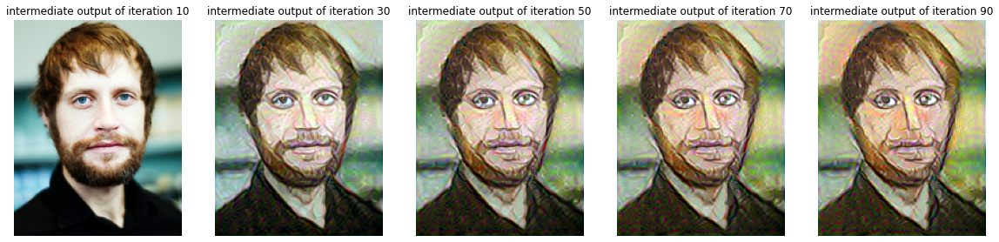

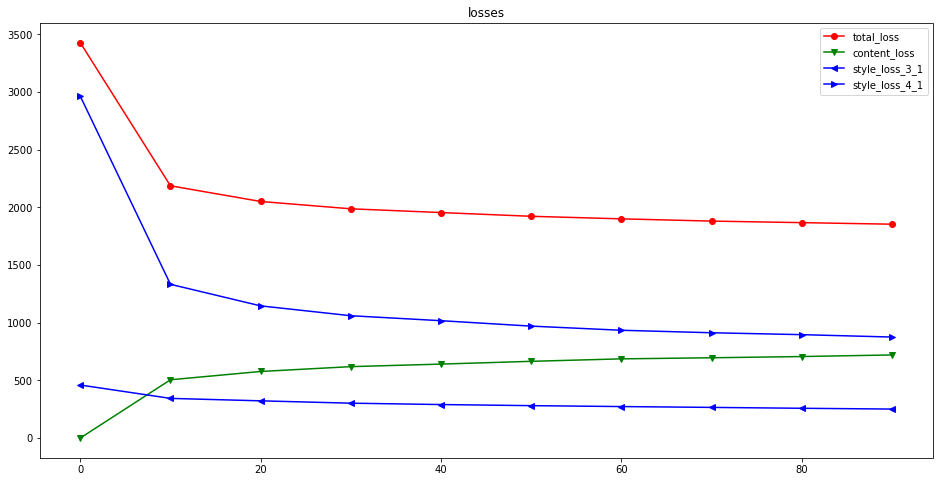

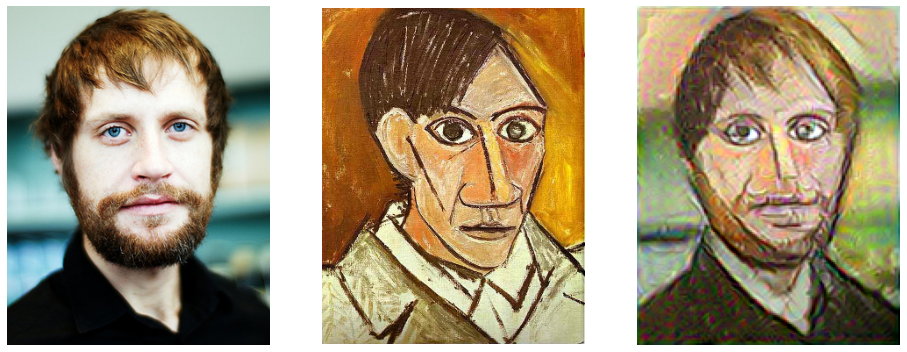

In [187]:
history_3 = generator_5.get_history()
visualise_history(history_3, 100)

## Experiment 4 : Architecture transfer

In [144]:
args.content = './data/content/church.jpg'
args.style = './data/style/goldChurch.jpg'
args.iterations = 100
args.style_weight = 10.0
args.phases = [0.25]
args.seed = 'content'

generator_6 = NeuralGenerator()
generator_6.run()

  - Loading `./data/content/church.jpg` for content data.
  - Loading `./data/style/goldChurch.jpg` for style data.

Phase #0: resolution 480x300  scale 0.25


/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'ds' parameter is not going to exist anymore as it is going to be replaced by the parameter 'ws'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'st' parameter is not going to exist anymore as it is going to be replaced by the parameter 'stride'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'padding' parameter is not going to exist anymore as it is going to be replaced by the parameter 'pad'.
  pooled = pool_2d(input,


  - Style layer 3_1: (1764, 256, 3, 3) patches in 4,064kb.
  - Style layer 4_1: (391, 512, 3, 3) patches in 1,801kb.
  - Content layer conv4_2: 512 features in 1,136kb.

  0   loss 1.50e+03   content 4_2 0.00e+00   style 3_1 2.30e+02  4_1 1.26e+03   quality  5.1%   time 23.6s 
 10   loss 1.21e+03   content 4_2 1.60e+02   style 3_1 1.99e+02  4_1 8.43e+02   quality 43.5%   time 151.5s 
 20   loss 1.15e+03   content 4_2 1.93e+02   style 3_1 1.84e+02  4_1 7.64e+02   quality 66.1%   time 116.4s 
 30   loss 1.12e+03   content 4_2 2.20e+02   style 3_1 1.73e+02  4_1 7.16e+02   quality 79.2%   time 114.1s 
 40   loss 1.10e+03   content 4_2 2.32e+02   style 3_1 1.65e+02  4_1 6.92e+02   quality 86.6%   time 110.8s 
 50   loss 1.08e+03   content 4_2 2.39e+02   style 3_1 1.58e+02  4_1 6.77e+02   quality 90.8%   time 114.0s 
 60   loss 1.07e+03   content 4_2 2.45e+02   style 3_1 1.53e+02  4_1 6.65e+02   quality 92.7%   time 111.4s 
 70   loss 1.06e+03   content 4_2 2.50e+02   style 3_1 1.48e+02  4_1

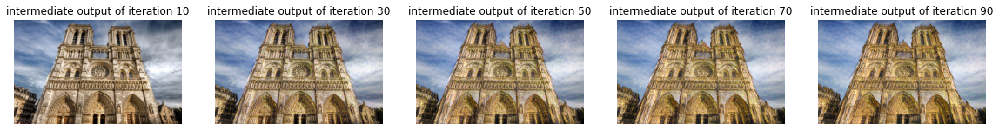

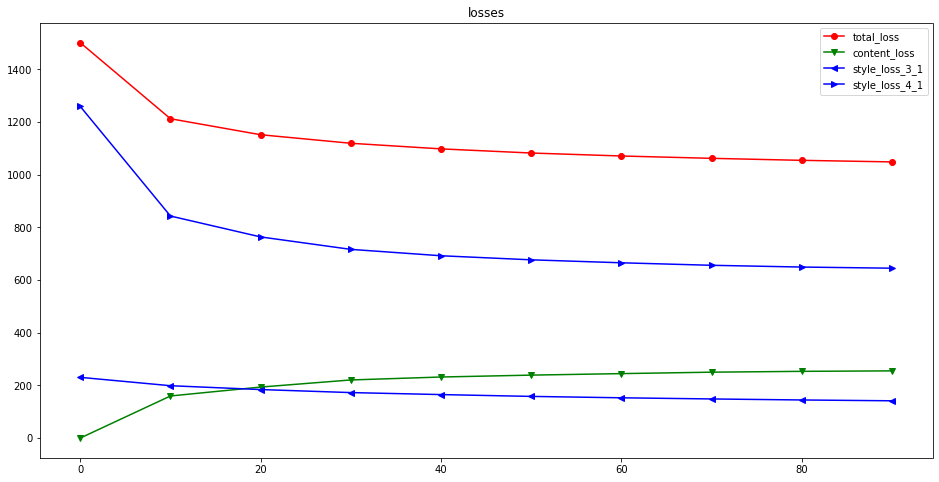

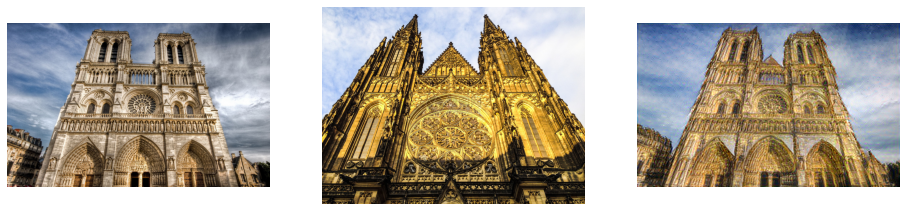

In [188]:
history_4 = generator_6.get_history()
visualise_history(history_4, 100)

## Experiment  4 : Portrait to Cartoon and Cartoon to Portrait

In [152]:
args.content = './data/content/photo.jpg'
args.style = './data/style/cartoon.jpg'
args.iterations = 100
args.style_weight = 10.0
args.phases = [0.15]
args.seed = 'content'
generator_7 = NeuralGenerator()
generator_7.run()

  - Loading `./data/content/photo.jpg` for content data.
  - Loading `./data/style/cartoon.jpg` for style data.

Phase #0: resolution 215x319  scale 0.15


/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'ds' parameter is not going to exist anymore as it is going to be replaced by the parameter 'ws'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'st' parameter is not going to exist anymore as it is going to be replaced by the parameter 'stride'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'padding' parameter is not going to exist anymore as it is going to be replaced by the parameter 'pad'.
  pooled = pool_2d(input,


  - Style layer 3_1: (2666, 256, 3, 3) patches in 6,142kb.
  - Style layer 4_1: (600, 512, 3, 3) patches in 2,764kb.
  - Content layer conv4_2: 512 features in 519kb.

  0   loss 1.77e+03   content 4_2 0.00e+00   style 3_1 2.89e+02  4_1 1.48e+03   quality  5.0%   time 5.8s 
 10   loss 1.45e+03   content 4_2 1.49e+02   style 3_1 2.66e+02  4_1 1.03e+03   quality 41.6%   time 56.9s 
 20   loss 1.34e+03   content 4_2 2.04e+02   style 3_1 2.44e+02  4_1 8.93e+02   quality 62.8%   time 53.3s 
 30   loss 1.28e+03   content 4_2 2.38e+02   style 3_1 2.26e+02  4_1 8.17e+02   quality 74.3%   time 64.1s 
 40   loss 1.25e+03   content 4_2 2.67e+02   style 3_1 2.12e+02  4_1 7.65e+02   quality 81.8%   time 72.7s 
 50   loss 1.22e+03   content 4_2 2.85e+02   style 3_1 2.00e+02  4_1 7.29e+02   quality 85.6%   time 68.2s 
 60   loss 1.20e+03   content 4_2 3.01e+02   style 3_1 1.91e+02  4_1 7.00e+02   quality 87.7%   time 65.0s 
 70   loss 1.18e+03   content 4_2 3.12e+02   style 3_1 1.84e+02  4_1 6.80e+02

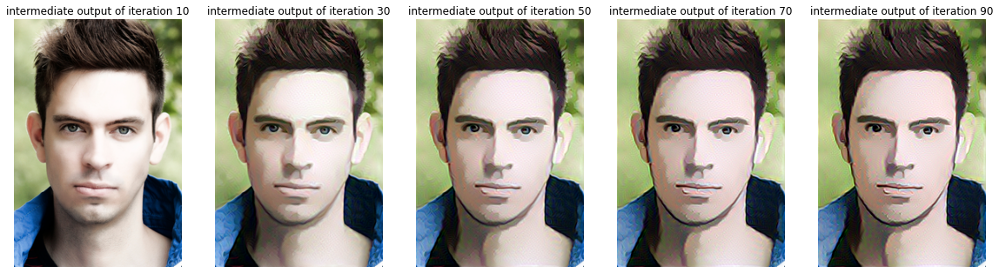

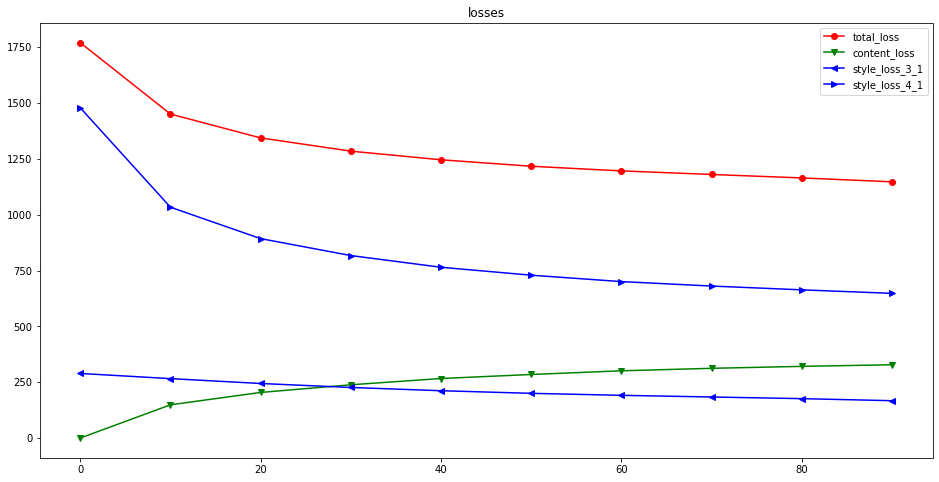

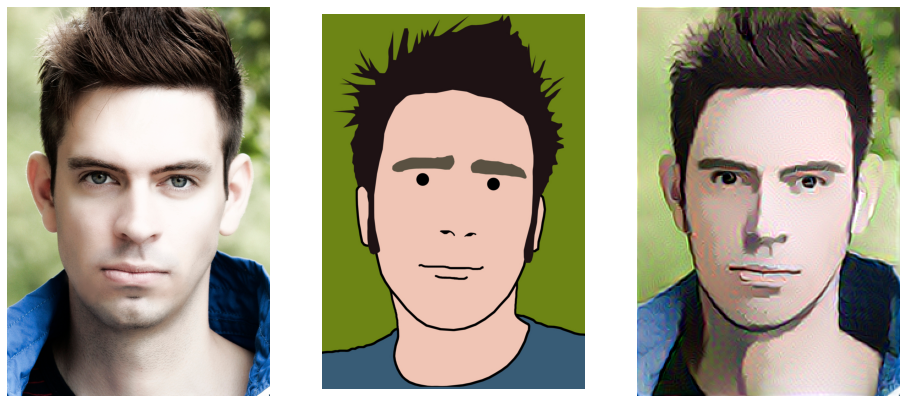

In [156]:
history_P2C = generator_7.get_history()
visualise_history(history_P2C, 100)

### Cartoon to portrait

In [157]:
args.style = './data/content/photo.jpg'
args.content = './data/style/cartoon.jpg'
args.iterations = 100
args.style_weight = 10.0
args.phases = [0.15]
args.seed = 'content'
generator_7 = NeuralGenerator()
generator_7.run()

  - Loading `./data/style/cartoon.jpg` for content data.
  - Loading `./data/content/photo.jpg` for style data.

Phase #0: resolution 180x257  scale 0.15


/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'ds' parameter is not going to exist anymore as it is going to be replaced by the parameter 'ws'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'st' parameter is not going to exist anymore as it is going to be replaced by the parameter 'stride'.
  pooled = pool_2d(input,
/Users/jiahuiwei/opt/anaconda3/lib/python3.8/site-packages/lasagne/layers/pool.py:261: UserWarning: DEPRECATION: the 'padding' parameter is not going to exist anymore as it is going to be replaced by the parameter 'pad'.
  pooled = pool_2d(input,


  - Style layer 3_1: (3927, 256, 3, 3) patches in 9,047kb.
  - Style layer 4_1: (888, 512, 3, 3) patches in 4,091kb.
  - Content layer conv4_2: 512 features in 360kb.

  0   loss 1.56e+03   content 4_2 0.00e+00   style 3_1 2.15e+02  4_1 1.33e+03   quality  5.0%   time 4.7s 
 10   loss 1.30e+03   content 4_2 1.51e+02   style 3_1 1.67e+02  4_1 9.68e+02   quality 41.5%   time 47.6s 
 20   loss 1.20e+03   content 4_2 1.83e+02   style 3_1 1.48e+02  4_1 8.65e+02   quality 62.6%   time 49.8s 
 30   loss 1.15e+03   content 4_2 2.19e+02   style 3_1 1.34e+02  4_1 7.95e+02   quality 74.5%   time 53.1s 
 40   loss 1.12e+03   content 4_2 2.36e+02   style 3_1 1.25e+02  4_1 7.54e+02   quality 81.3%   time 53.7s 
 50   loss 1.10e+03   content 4_2 2.47e+02   style 3_1 1.18e+02  4_1 7.30e+02   quality 85.4%   time 54.7s 
 60   loss 1.08e+03   content 4_2 2.56e+02   style 3_1 1.13e+02  4_1 7.11e+02   quality 88.0%   time 64.1s 
 70   loss 1.07e+03   content 4_2 2.62e+02   style 3_1 1.09e+02  4_1 6.97e+02

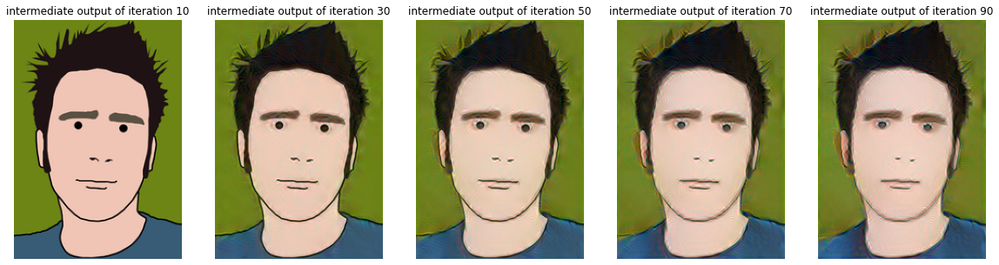

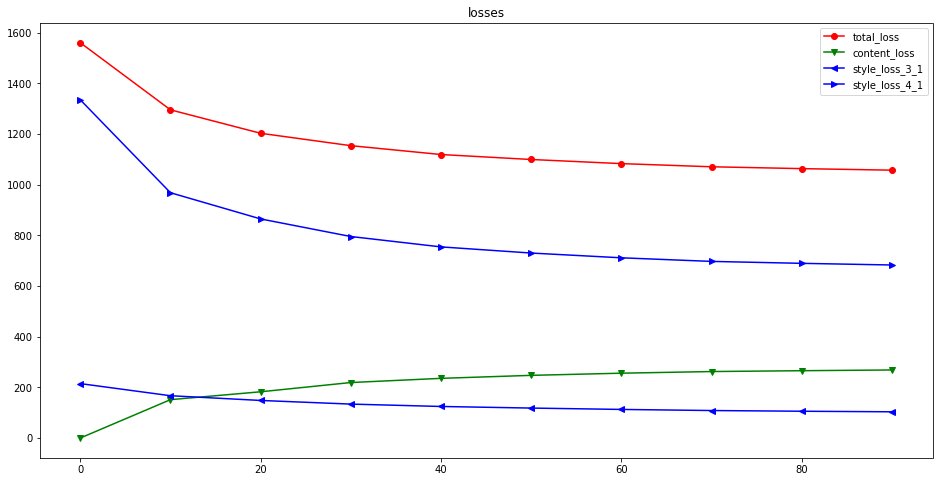

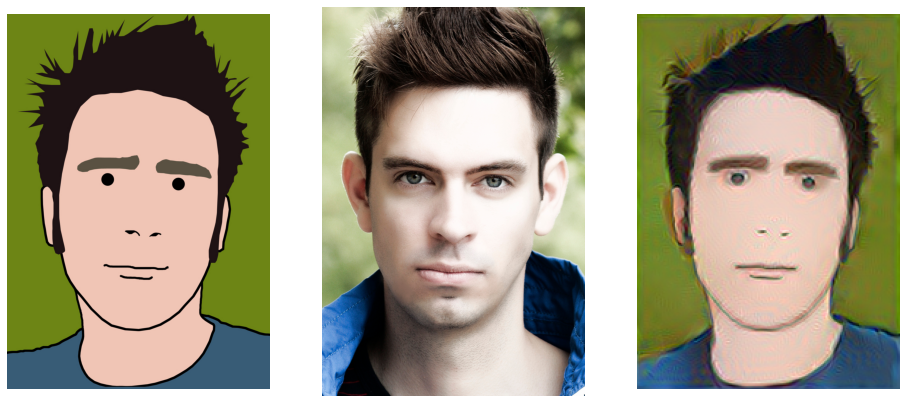

In [159]:
history_C2P = generator_7.get_history()
visualise_history(history_C2P, 100)

In [164]:
args.style = './data/content/photo.jpg'
args.content = './data/style/cartoon.jpg'
args.iterations = 100
args.style_weight = 15.0
args.phases = [0.15]
args.seed = 'content'
generator_7 = NeuralGenerator()
generator_7.run()

  - Loading `./data/style/cartoon.jpg` for content data.
  - Loading `./data/content/photo.jpg` for style data.

Phase #0: resolution 180x257  scale 0.15
  - Style layer 3_1: (3927, 256, 3, 3) patches in 9,047kb.
  - Style layer 4_1: (888, 512, 3, 3) patches in 4,091kb.
  - Content layer conv4_2: 512 features in 360kb.

  0   loss 2.33e+03   content 4_2 0.00e+00   style 3_1 3.22e+02  4_1 2.00e+03   quality  4.9%   time 5.1s 
 10   loss 1.84e+03   content 4_2 2.47e+02   style 3_1 2.42e+02  4_1 1.34e+03   quality 40.8%   time 56.6s 
 20   loss 1.66e+03   content 4_2 2.87e+02   style 3_1 2.12e+02  4_1 1.15e+03   quality 61.3%   time 47.6s 
 30   loss 1.57e+03   content 4_2 3.36e+02   style 3_1 1.90e+02  4_1 1.04e+03   quality 73.4%   time 44.8s 
 40   loss 1.51e+03   content 4_2 3.63e+02   style 3_1 1.73e+02  4_1 9.73e+02   quality 80.0%   time 45.8s 
 50   loss 1.47e+03   content 4_2 3.82e+02   style 3_1 1.61e+02  4_1 9.26e+02   quality 84.4%   time 50.8s 
 60   loss 1.45e+03   content 4

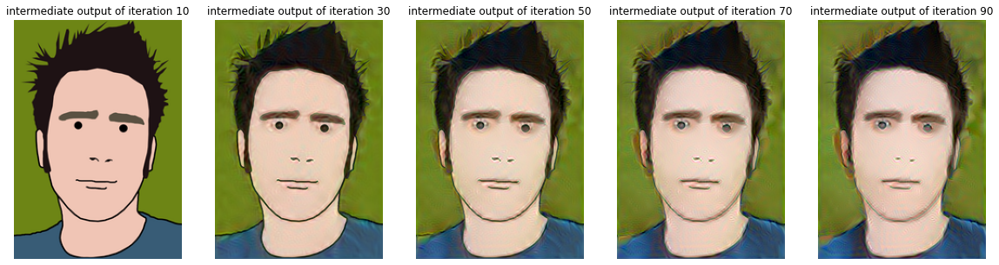

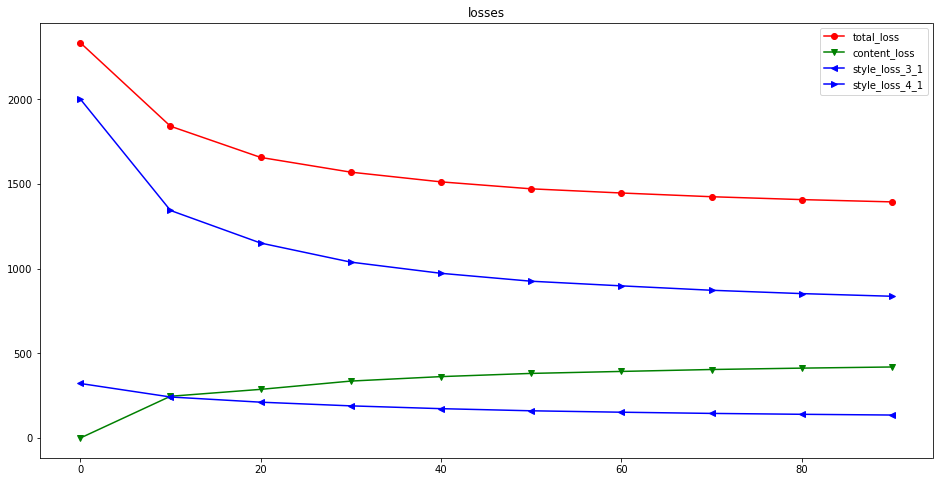

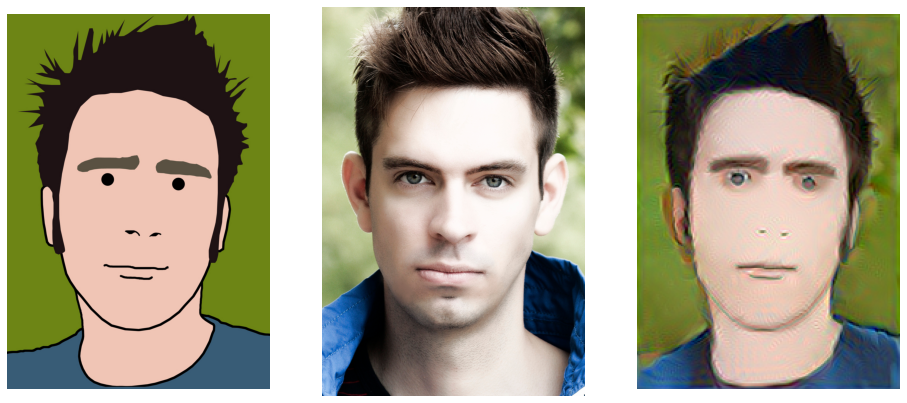

In [165]:
visualise_history(generator_7.get_history(), 100)

## Experiment 5 : For fun, Xi & Trump transfer

In [174]:
args.content = './data/content/xi.jpg'
args.style = './data/style/trump.jpg'
args.iterations = 100
args.style_weight = 12.0
args.phases = [0.3]
args.seed = 'content'
generator_fun = NeuralGenerator()
generator_fun.run()

  - Loading `./data/content/xi.jpg` for content data.
  - Loading `./data/style/trump.jpg` for style data.

Phase #0: resolution 267x384  scale 0.3
  - Style layer 3_1: (1189, 256, 3, 3) patches in 2,739kb.
  - Style layer 4_1: (247, 512, 3, 3) patches in 1,138kb.
  - Content layer conv4_2: 512 features in 811kb.

  0   loss 3.25e+03   content 4_2 0.00e+00   style 3_1 3.78e+02  4_1 2.87e+03   quality  5.0%   time 8.1s 
 10   loss 3.05e+03   content 4_2 2.94e+02   style 3_1 4.67e+02  4_1 2.29e+03   quality 42.6%   time 76.2s 
 20   loss 2.96e+03   content 4_2 4.03e+02   style 3_1 4.80e+02  4_1 2.07e+03   quality 64.6%   time 73.7s 
 30   loss 2.91e+03   content 4_2 4.79e+02   style 3_1 4.84e+02  4_1 1.94e+03   quality 77.1%   time 89.2s 
 40   loss 2.85e+03   content 4_2 5.16e+02   style 3_1 4.72e+02  4_1 1.86e+03   quality 83.8%   time 91.5s 
 50   loss 2.81e+03   content 4_2 5.42e+02   style 3_1 4.60e+02  4_1 1.80e+03   quality 87.5%   time 87.3s 
 60   loss 2.78e+03   content 4_2 5.6

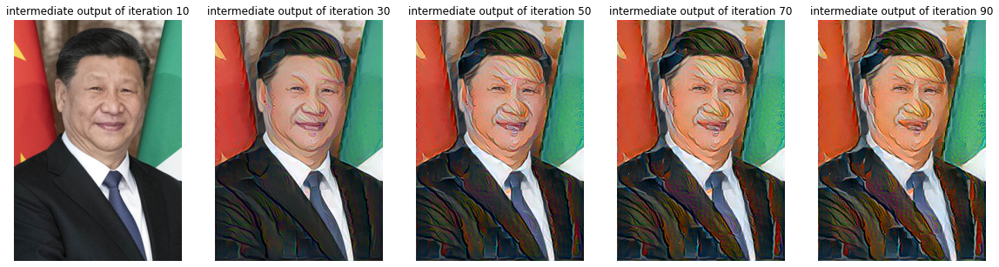

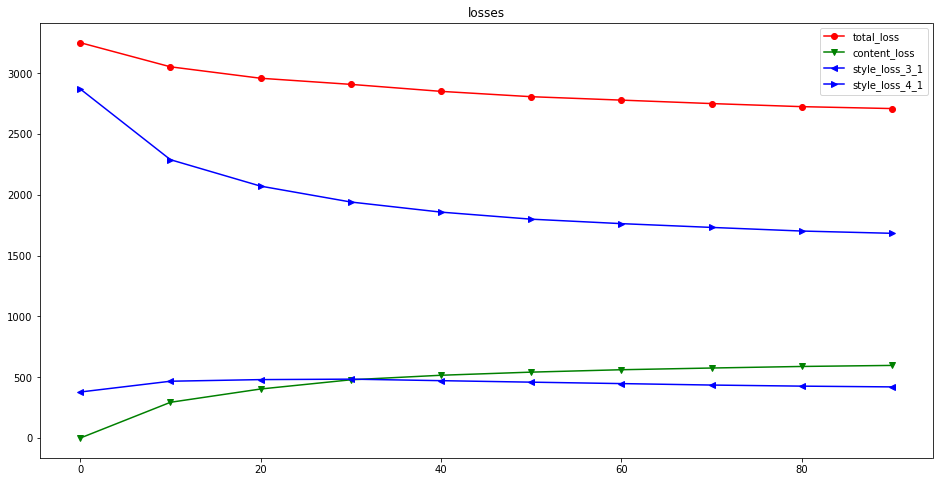

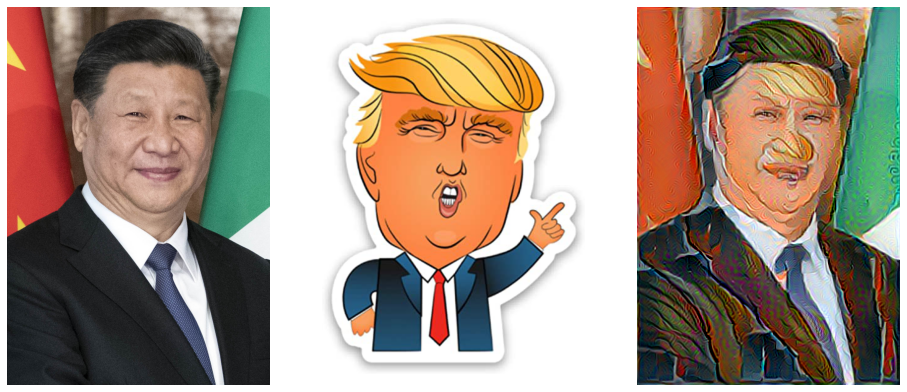

In [175]:
visualise_history(generator_fun.get_history(), 100)

## Conclusion 

The CNNMRF model is kind of Non-parametric Slow Neural Method, it's computional expensive and cannot be used in some realtime applications. However, it did well in most style transfer cases. Unlike the Fast Neural Method Based On Offiline Model who is generally used for a fixed style transferation, this kind of model could be used for any kind of styles.

The advantage of this model is that it uses the MRF as a prior to gather local style and in this way, it optimises the performance of style transfer used by Gatys in both of quality in most cases and computional times.

However, as we will make a patch match using the MRF, so the computional cost is highly depended on the image resolution. 

In this document, we introduces 3 generation ways : from content, from noise and pyramide based hybride models.

With model generated from content, the image will converge faster and conserve better the content information, and with that generated from noise, it may takes more time to reach the same level in terms of content loss but it does better in saving some details, these details are more natural. Finally, for some complicated cases like reconstruct a image conserving better the details(face construction for example), we could use the pyramide structure in which we will generate the synthesised image from a pyramide-scales and with this, we finally decrease the total loss of synthesised image.

There are also several disadvantages, firstly, it did bad in face reconstruct and building details transfer, like the experiment we did for cartoon to portrait and architecture transfer. And for some other examples, like dog_A to dog_B, people_A to people_B, our model only changes in color term, with few complicated details.

## Reference

[1] Paper: Combining Markov Random Fields and Convolutional Neural Networks for Image Synthesis, 2016 

https://arxiv.org/abs/1601.04589


[2] Github: neural doodle application using cnnmrf. 


https://github.com/alexjc/neural-doodle

[3] Github: CNNMRF from chuanli, auther of the original paper.

https://github.com/chuanli11/CNNMRF